# **Importing Libraries**

In [26]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 3.2 MB/s eta 0:00:00


In [30]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import shap

# **Understanding the dataset**

In [2]:
df = pd.read_csv('AmesHousing.csv')
df.head()

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order            2930 non-null   int64  
 1   PID              2930 non-null   int64  
 2   MS SubClass      2930 non-null   int64  
 3   MS Zoning        2930 non-null   object 
 4   Lot Frontage     2440 non-null   float64
 5   Lot Area         2930 non-null   int64  
 6   Street           2930 non-null   object 
 7   Alley            198 non-null    object 
 8   Lot Shape        2930 non-null   object 
 9   Land Contour     2930 non-null   object 
 10  Utilities        2930 non-null   object 
 11  Lot Config       2930 non-null   object 
 12  Land Slope       2930 non-null   object 
 13  Neighborhood     2930 non-null   object 
 14  Condition 1      2930 non-null   object 
 15  Condition 2      2930 non-null   object 
 16  Bldg Type        2930 non-null   object 
 17  House Style   

In [4]:
df.describe()

,Order,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,...,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
count,2930.00000,2.930000e+03,2930.000000,2440.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2907.000000,...,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000
mean,1465.50000,7.144645e+08,57.387372,69.224590,10147.921843,6.094881,5.563140,1971.356314,1984.266553,101.896801,...,93.751877,47.533447,23.011604,2.592491,16.002048,2.243345,50.635154,6.216041,2007.790444,180796.060068
std,845.96247,1.887308e+08,42.638025,23.365335,7880.017759,1.411026,1.111537,30.245361,20.860286,179.112611,...,126.361562,67.483400,64.139059,25.141331,56.087370,35.597181,566.344288,2.714492,1.316613,79886.692357
min,1.00000,5.263011e+08,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,12789.000000
25%,733.25000,5.284770e+08,20.000000,58.000000,7440.250000,5.000000,5.000000,1954.000000,1965.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,129500.000000
50%,1465.50000,5.354536e+08,50.000000,68.000000,9436.500000,6.000000,5.000000,1973.000000,1993.000000,0.000000,...,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,160000.000000
75%,2197.75000,9.071811e+08,70.000000,80.000000,11555.250000,7.000000,6.000000,2001.000000,2004.000000,164.000000,...,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,213500.000000
max,2930.00000,1.007100e+09,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,...,1424.000000,742.000000,1012.000000,508.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000,755000.000000


# **Data Cleaning**

In [5]:
missing_values = df.isnull().sum()
print(missing_values[missing_values > 0])

Lot Frontage       490
Alley             2732
Mas Vnr Type      1775
Mas Vnr Area        23
Bsmt Qual           80
Bsmt Cond           80
Bsmt Exposure       83
BsmtFin Type 1      80
BsmtFin SF 1         1
BsmtFin Type 2      81
BsmtFin SF 2         1
Bsmt Unf SF          1
Total Bsmt SF        1
Electrical           1
Bsmt Full Bath       2
Bsmt Half Bath       2
Fireplace Qu      1422
Garage Type        157
Garage Yr Blt      159
Garage Finish      159
Garage Cars          1
Garage Area          1
Garage Qual        159
Garage Cond        159
Pool QC           2917
Fence             2358
Misc Feature      2824
dtype: int64


In [6]:
# Separate numerical and categorical columns
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns
categorical_features = df.select_dtypes(include=['object']).columns

# print(numerical_features)
# print(categorical_features)

# Handle missing values
# Fill numerical features with median
numerical_imputer = SimpleImputer(strategy='median')
df[numerical_features] = numerical_imputer.fit_transform(df[numerical_features])

# Fill categorical features with mode
categorical_imputer = SimpleImputer(strategy='most_frequent')
df[categorical_features] = categorical_imputer.fit_transform(df[categorical_features])

In [7]:
duplicates = df.duplicated().sum()
print(f'Duplicates: {duplicates}')

# Optional: Remove duplicates if any
df.drop_duplicates()

Duplicates: 0


,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1.0,526301100.0,20.0,RL,141.0,31770.0,Pave,Grvl,IR1,Lvl,...,0.0,Ex,MnPrv,Shed,0.0,5.0,2010.0,WD,Normal,215000.0
1,2.0,526350040.0,20.0,RH,80.0,11622.0,Pave,Grvl,Reg,Lvl,...,0.0,Ex,MnPrv,Shed,0.0,6.0,2010.0,WD,Normal,105000.0
2,3.0,526351010.0,20.0,RL,81.0,14267.0,Pave,Grvl,IR1,Lvl,...,0.0,Ex,MnPrv,Gar2,12500.0,6.0,2010.0,WD,Normal,172000.0
3,4.0,526353030.0,20.0,RL,93.0,11160.0,Pave,Grvl,Reg,Lvl,...,0.0,Ex,MnPrv,Shed,0.0,4.0,2010.0,WD,Normal,244000.0
4,5.0,527105010.0,60.0,RL,74.0,13830.0,Pave,Grvl,IR1,Lvl,...,0.0,Ex,MnPrv,Shed,0.0,3.0,2010.0,WD,Normal,189900.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,2926.0,923275080.0,80.0,RL,37.0,7937.0,Pave,Grvl,IR1,Lvl,...,0.0,Ex,GdPrv,Shed,0.0,3.0,2006.0,WD,Normal,142500.0
2926,2927.0,923276100.0,20.0,RL,68.0,8885.0,Pave,Grvl,IR1,Low,...,0.0,Ex,MnPrv,Shed,0.0,6.0,2006.0,WD,Normal,131000.0
2927,2928.0,923400125.0,85.0,RL,62.0,10441.0,Pave,Grvl,Reg,Lvl,...,0.0,Ex,MnPrv,Shed,700.0,7.0,2006.0,WD,Normal,132000.0
2928,2929.0,924100070.0,20.0,RL,77.0,10010.0,Pave,Grvl,Reg,Lvl,...,0.0,Ex,MnPrv,Shed,0.0,4.0,2006.0,WD,Normal,170000.0


# **Data Visualization**

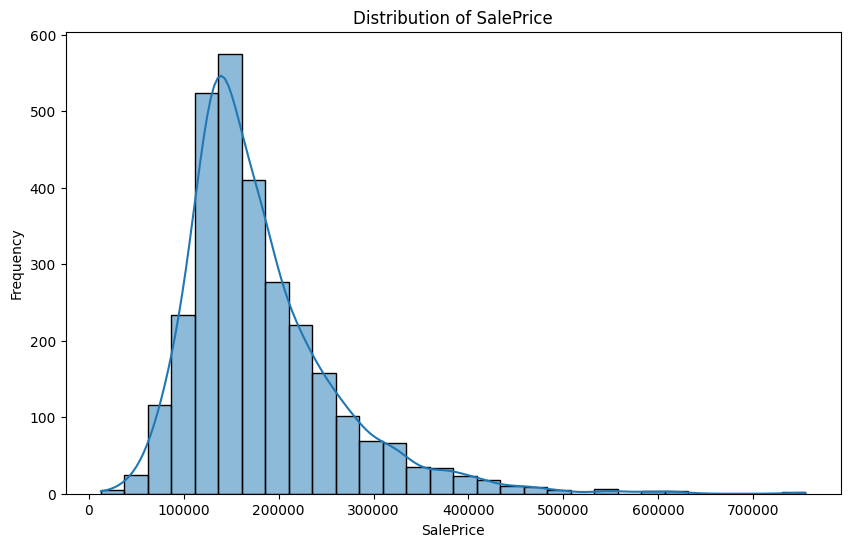

In [8]:
# Distribution of the target variable (SalePrice)
plt.figure(figsize=(10, 6))
sns.histplot(df['SalePrice'], kde=True, bins=30)
plt.title('Distribution of SalePrice')
plt.xlabel('SalePrice')
plt.ylabel('Frequency')
plt.show()

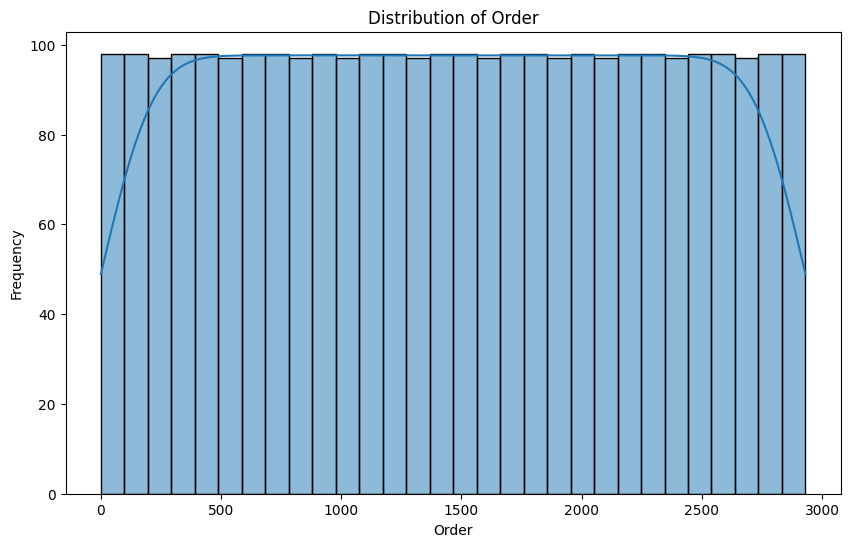

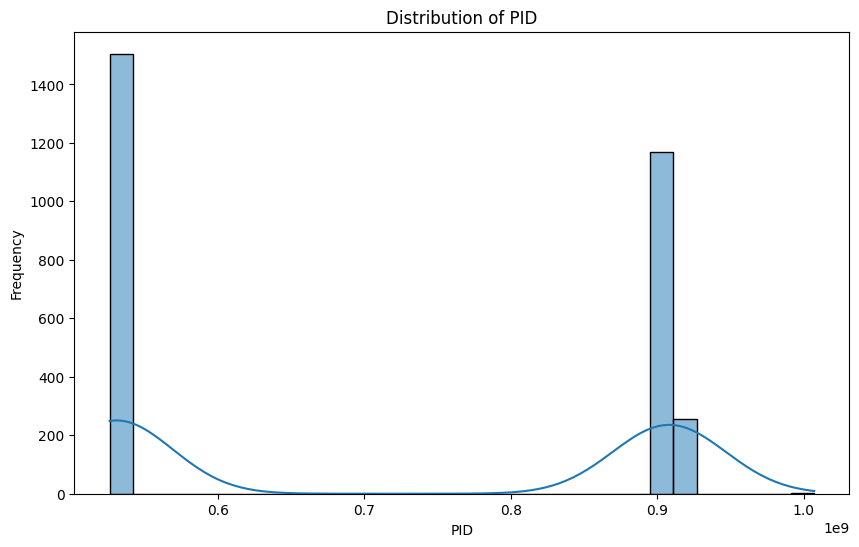

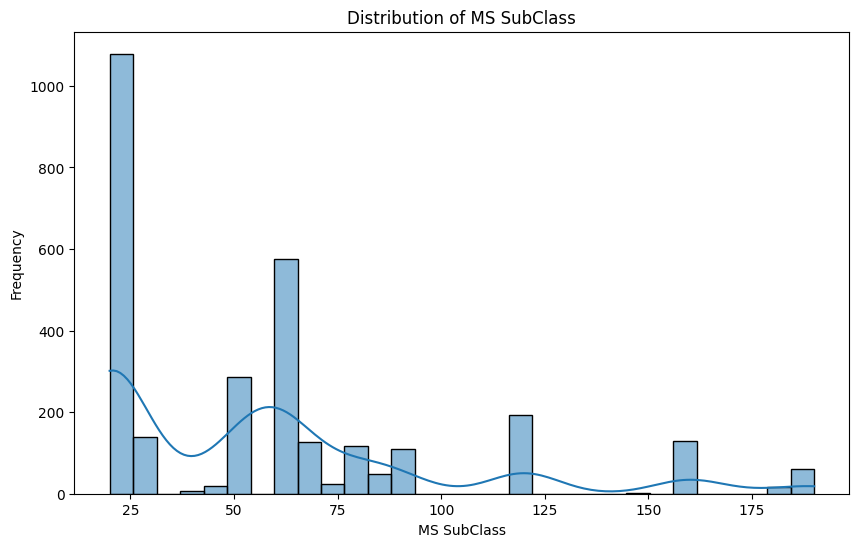

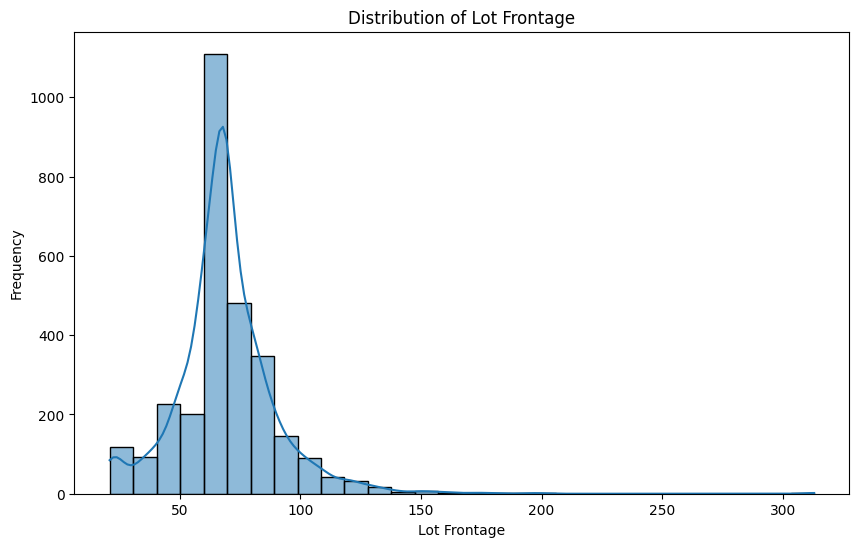

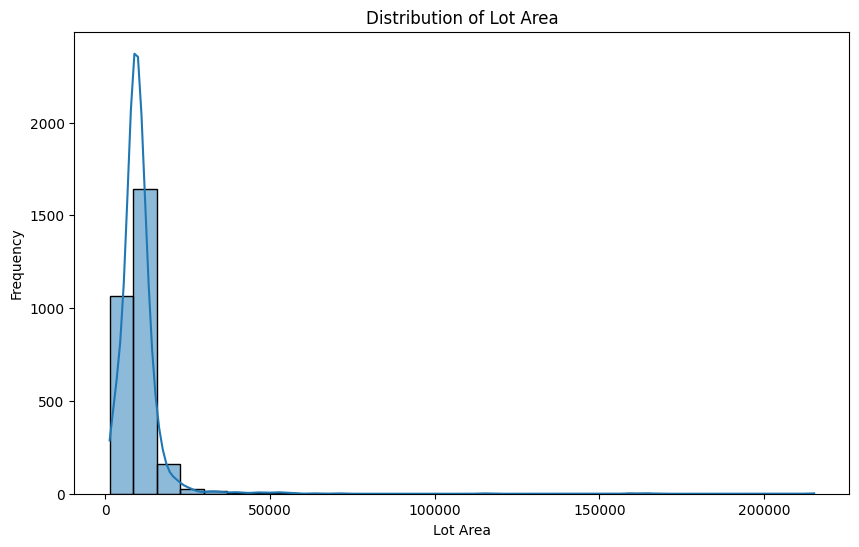

...

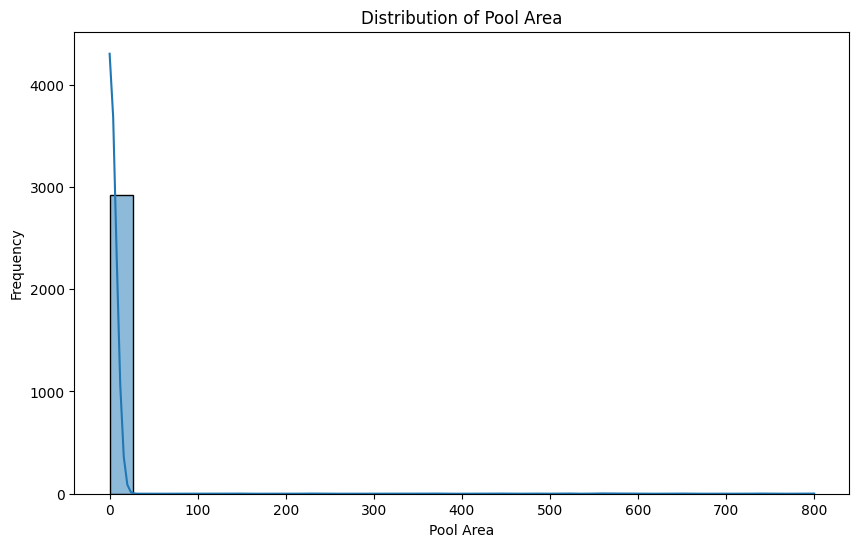

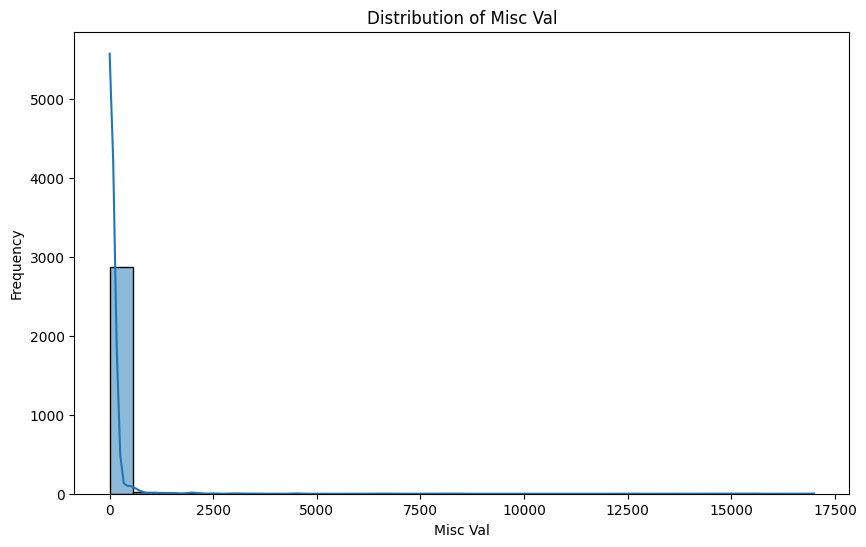

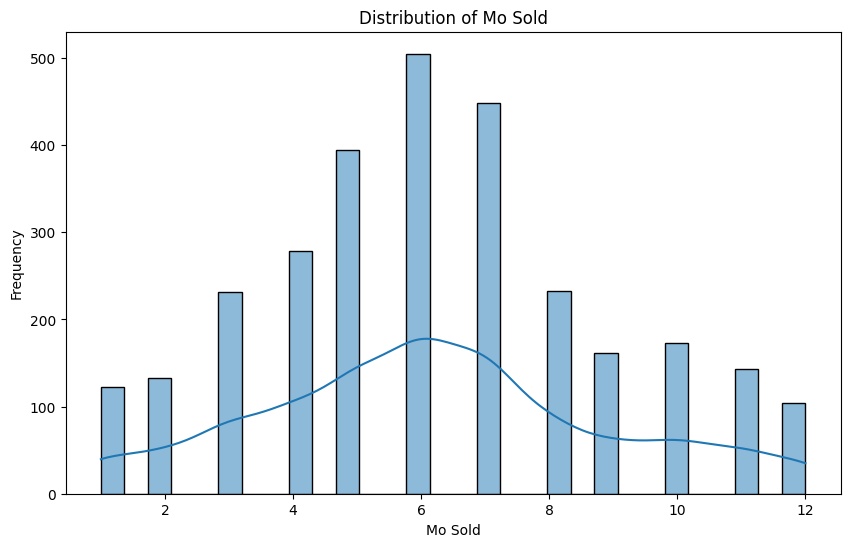

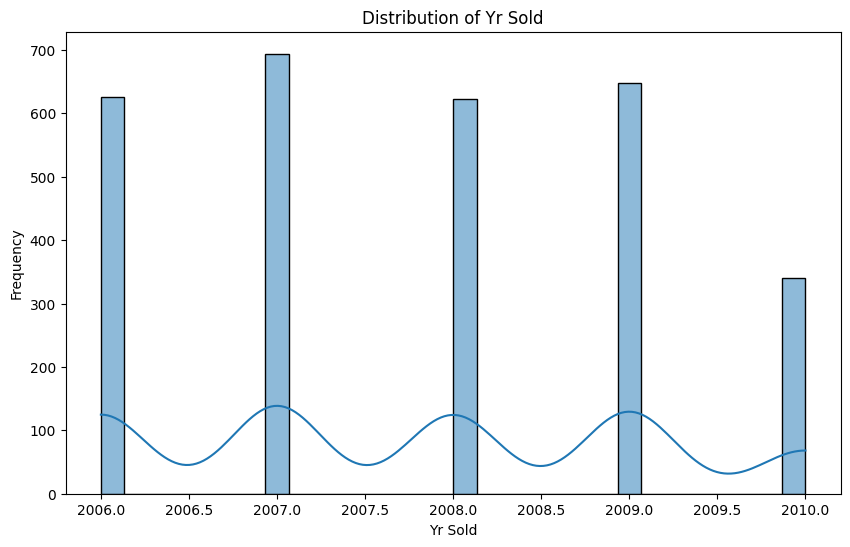

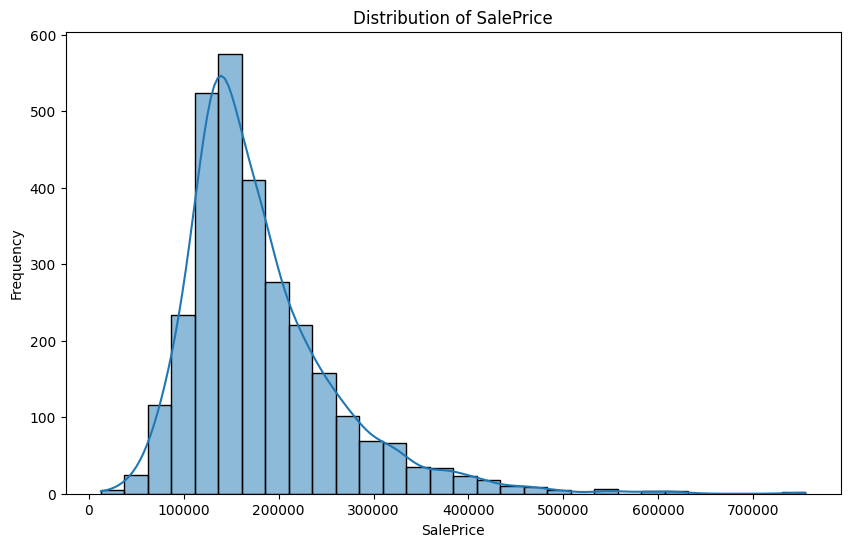

In [9]:
# Distribution of numerical features
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns
for feature in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[feature], kde=True, bins=30)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

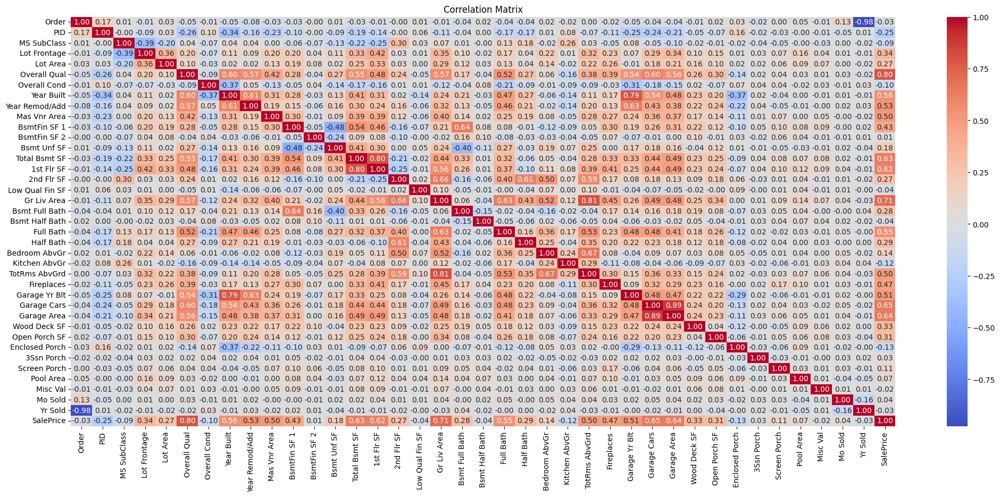

In [10]:
# Correlation matrix for numerical features
corr_matrix = df.select_dtypes(include=['int64', 'float64']).corr() # Select only numerical columns
plt.figure(figsize=(25, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

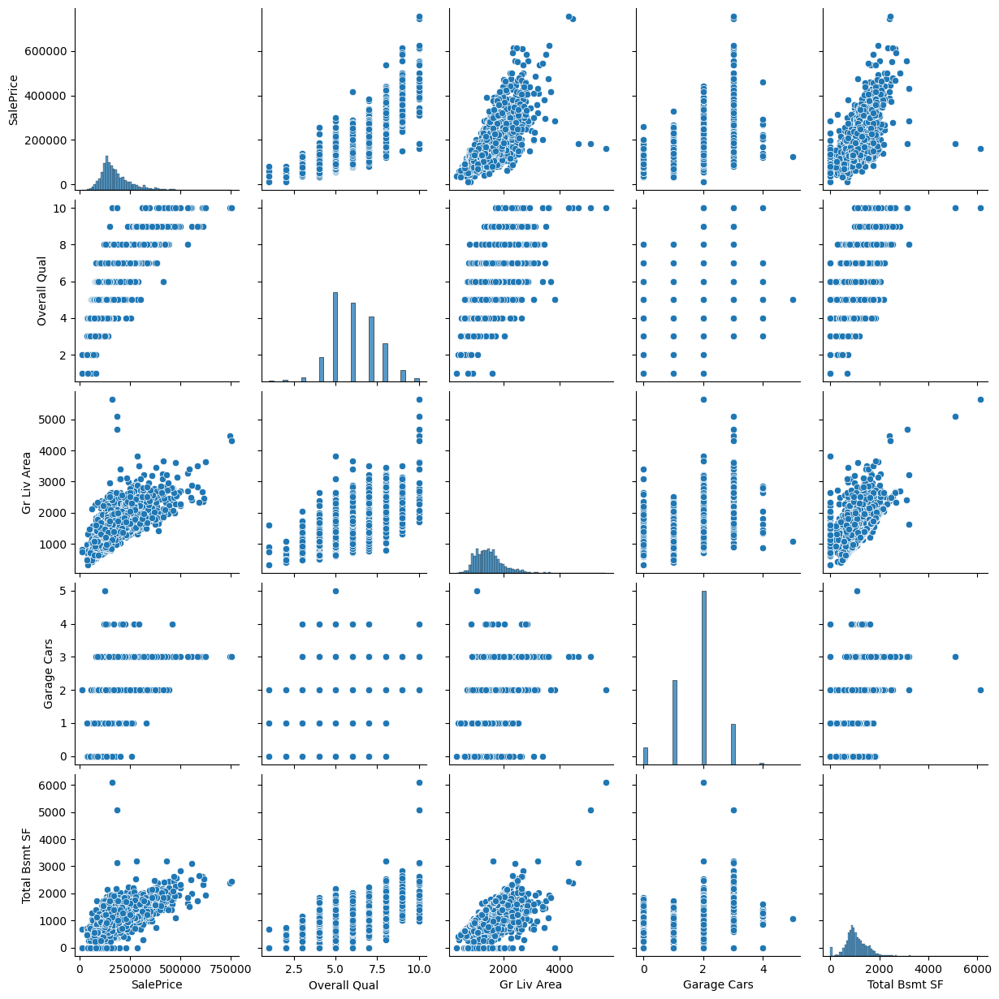

In [11]:
# Pair plot for a subset of features
subset_features = ['SalePrice', 'Overall Qual', 'Gr Liv Area', 'Garage Cars', 'Total Bsmt SF']
sns.pairplot(df[subset_features])
plt.show()

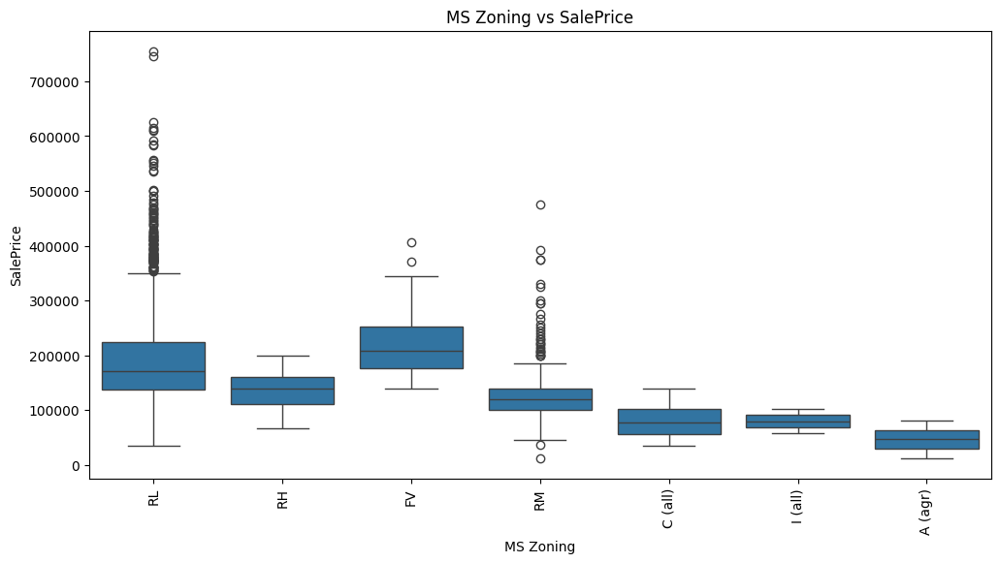

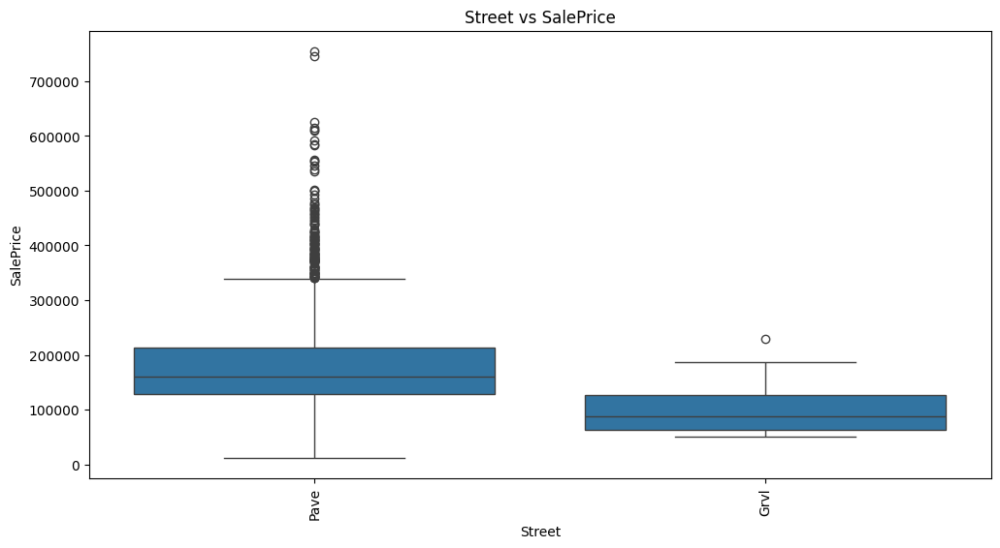

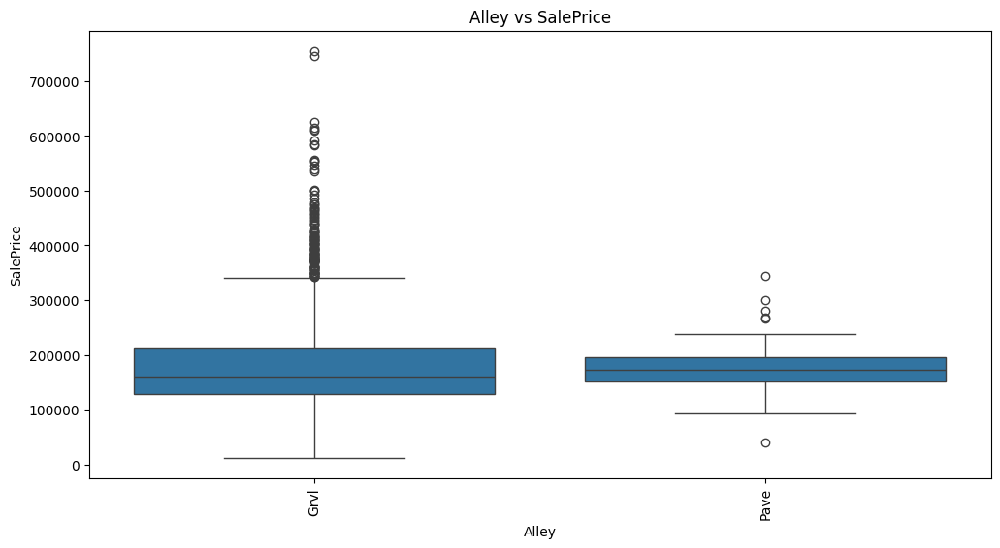

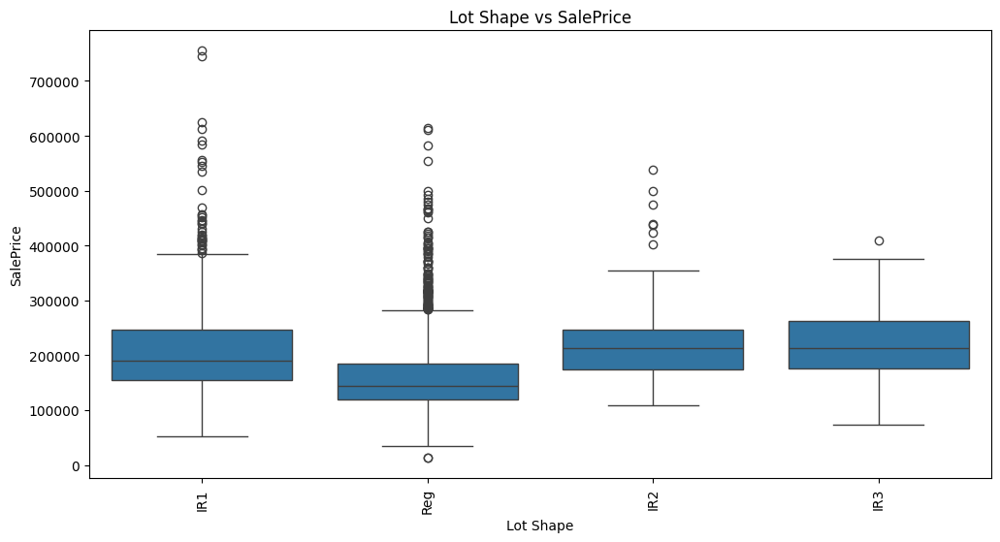

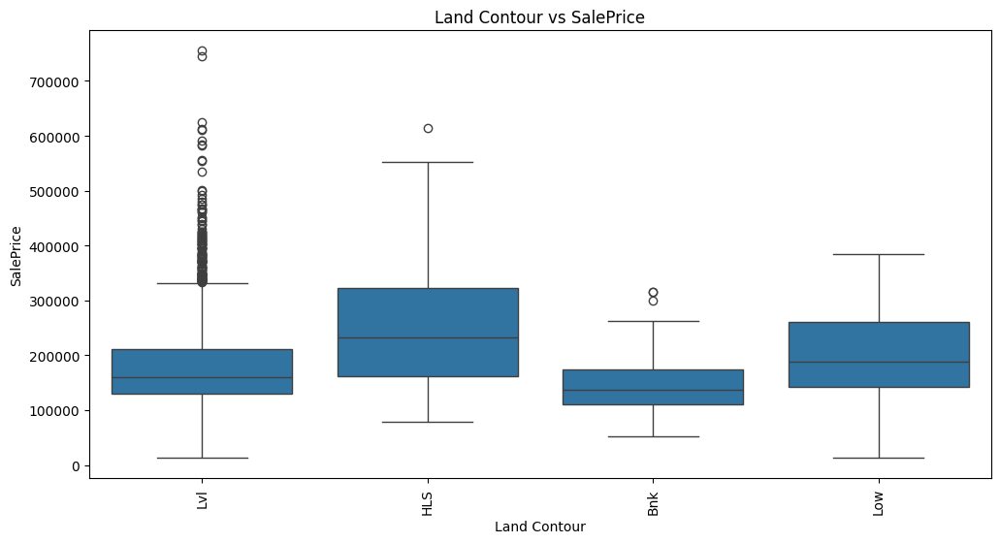

...

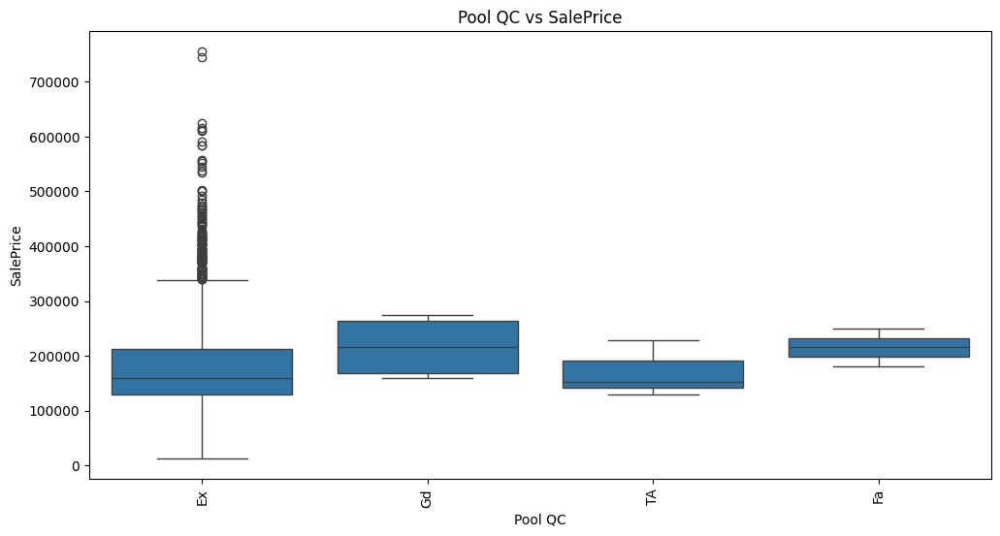

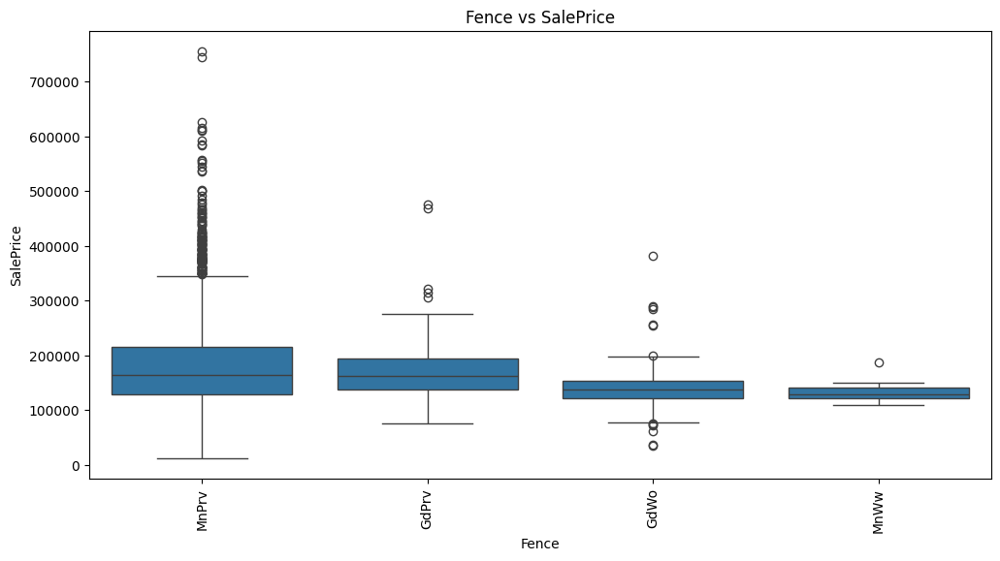

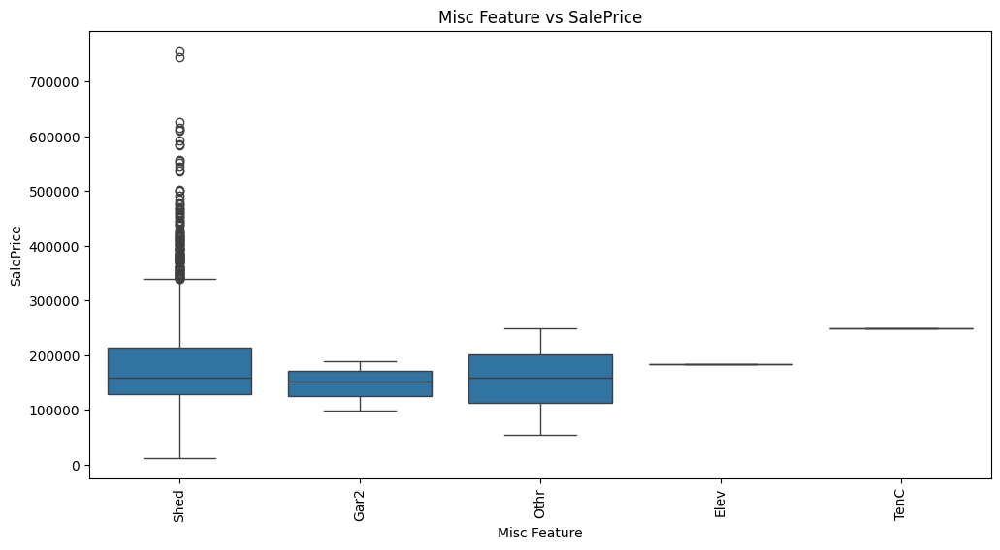

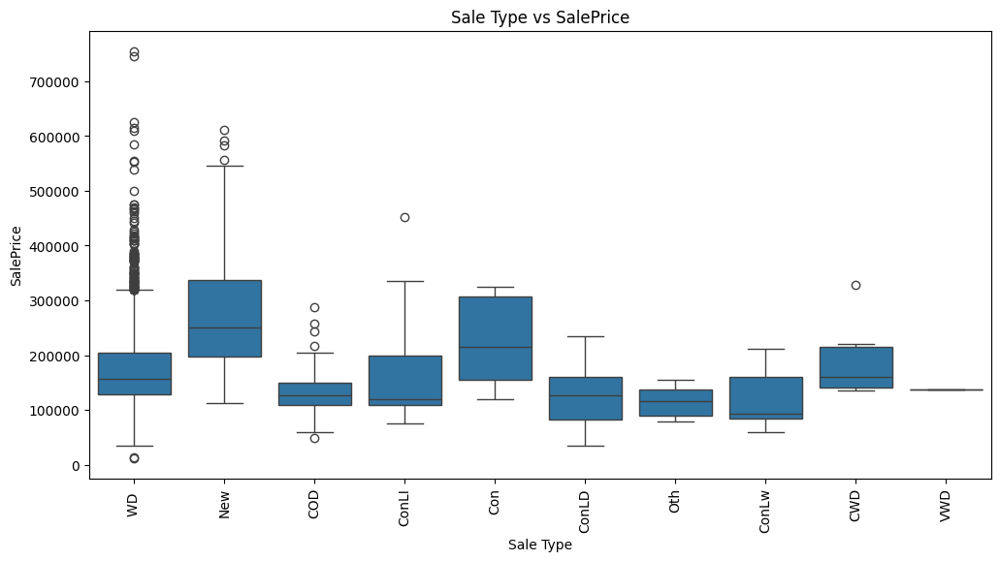

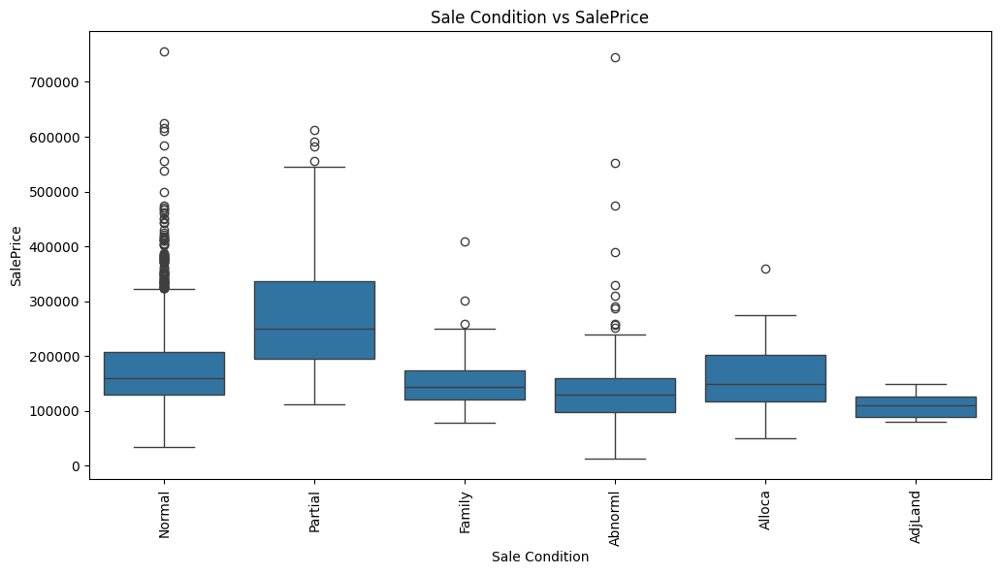

In [12]:
# Box plots for categorical features vs SalePrice
categorical_features = df.select_dtypes(include=['object']).columns
for feature in categorical_features:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x=feature, y='SalePrice', data=df)
    plt.title(f'{feature} vs SalePrice')
    plt.xticks(rotation=90)
    plt.show()


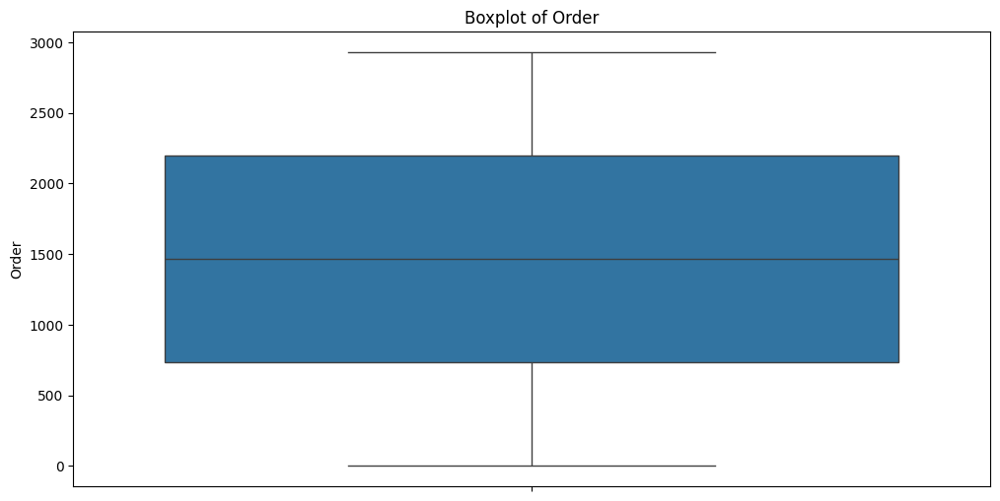

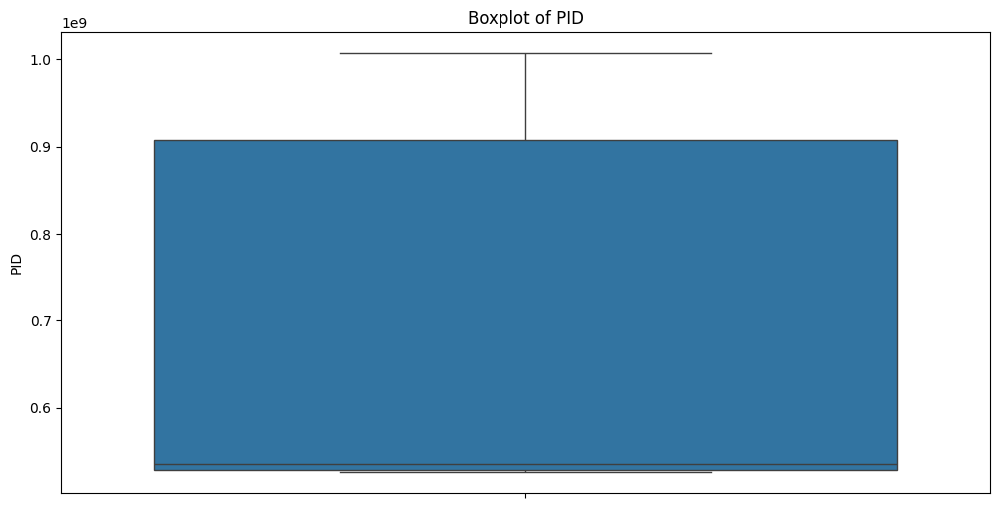

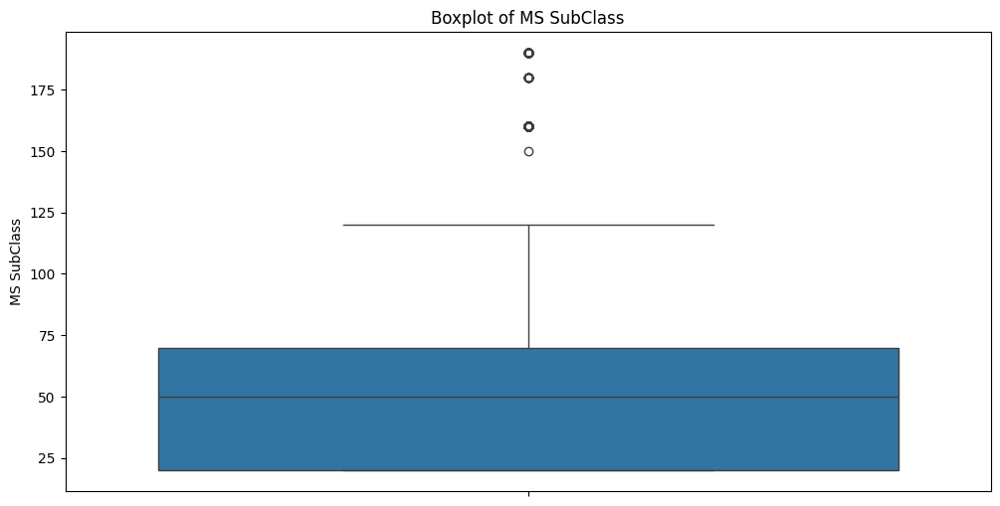

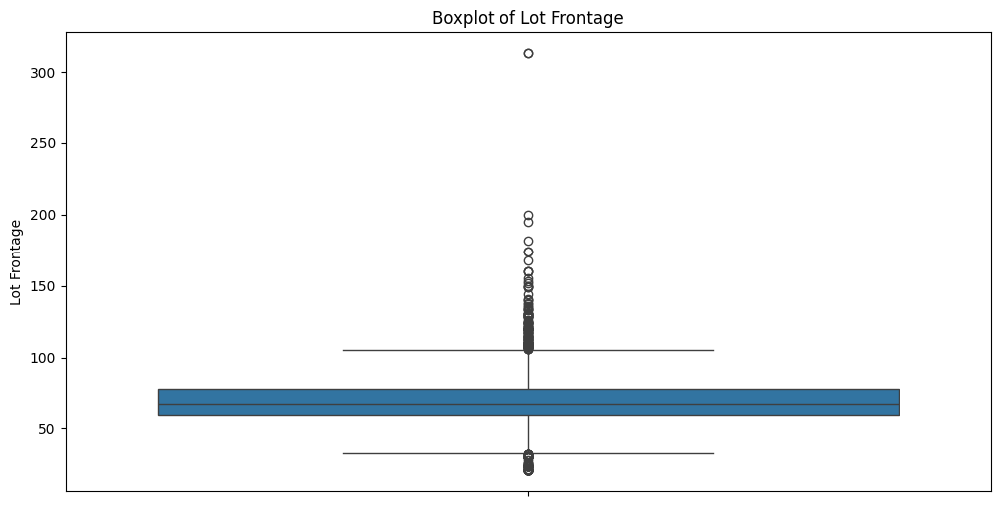

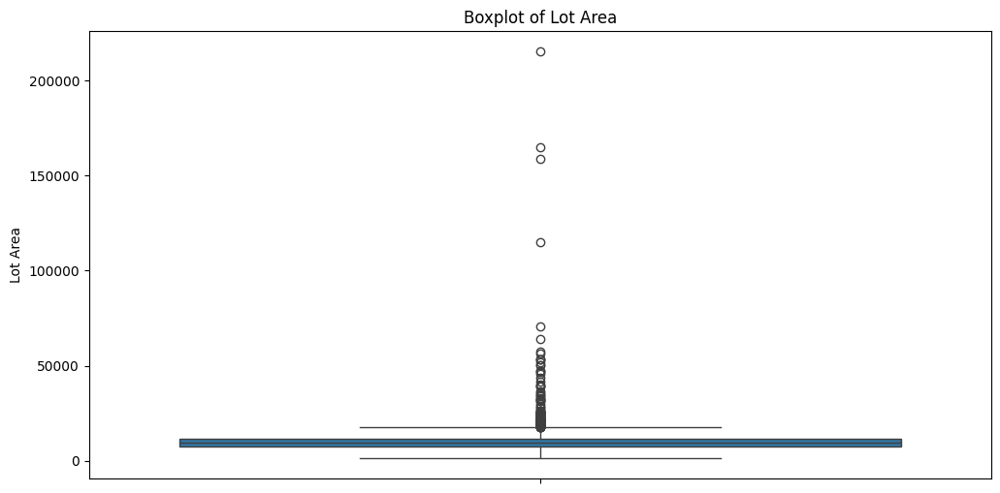

...

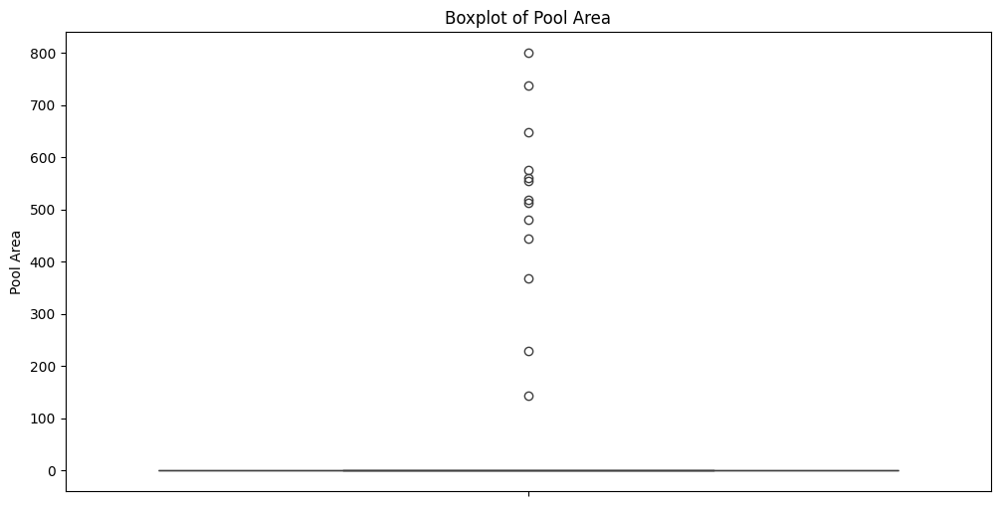

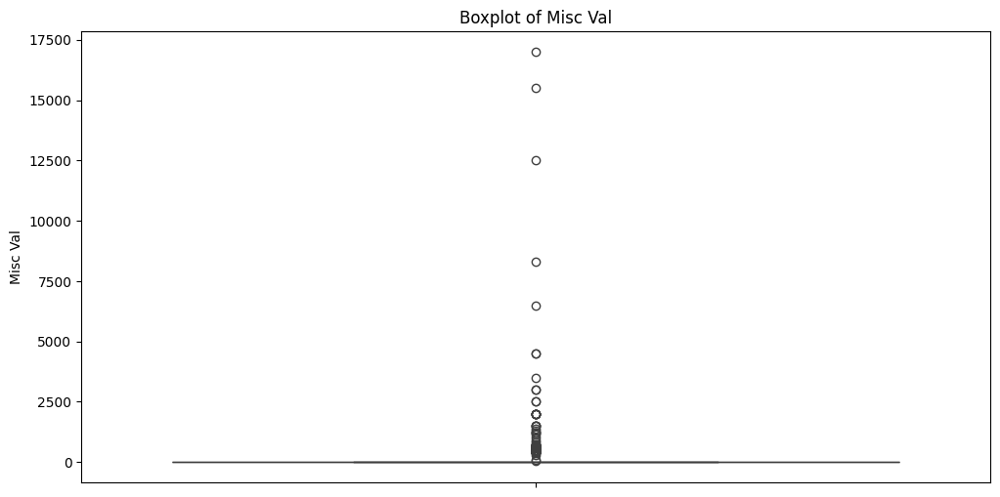

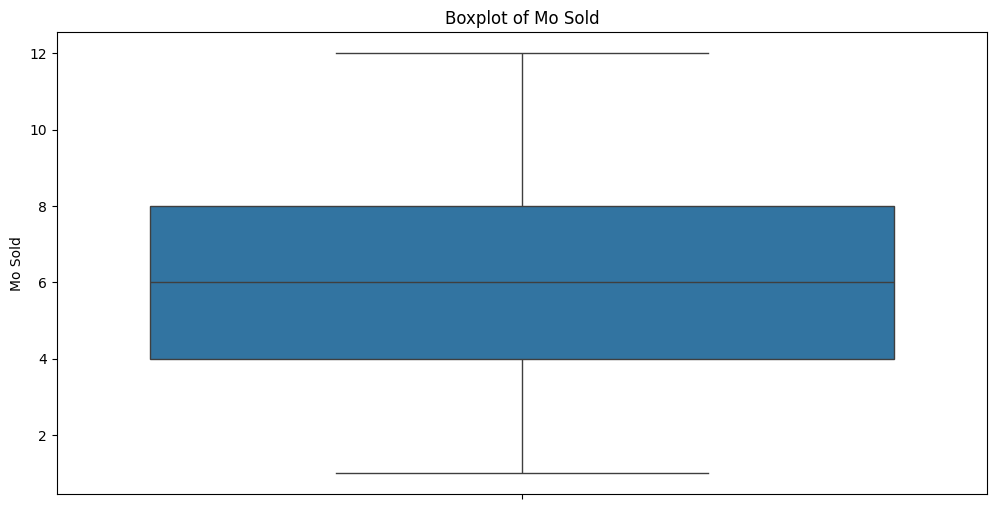

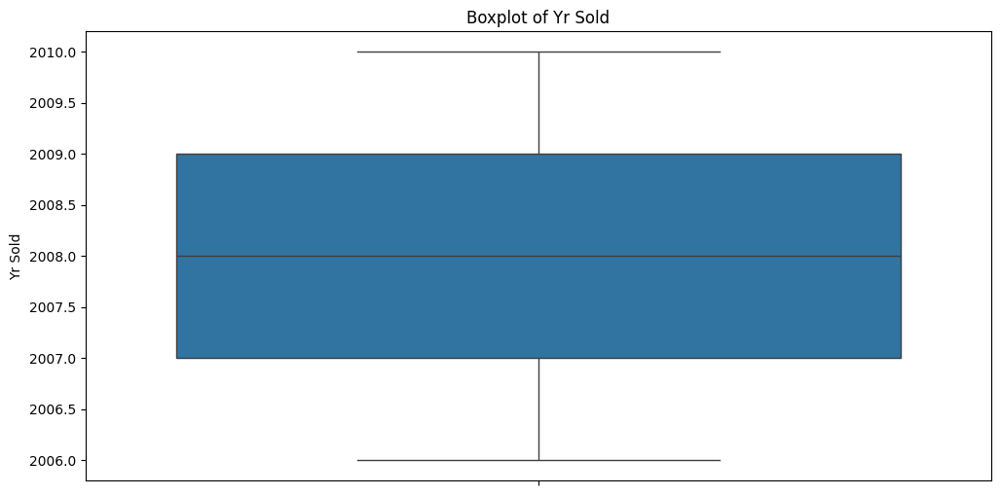

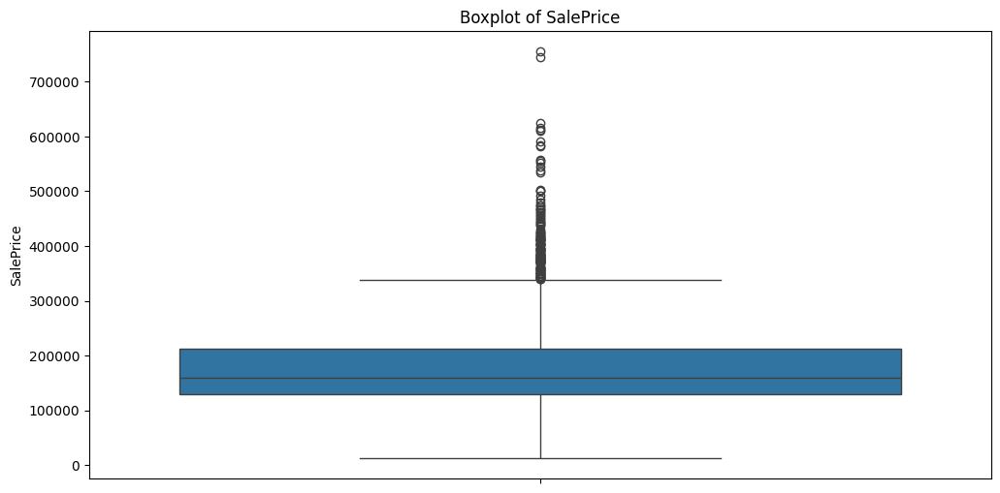

In [13]:
# Box plots to visualize outliers
for feature in numerical_features:
    plt.figure(figsize=(12, 6))
    sns.boxplot(df[feature])
    plt.title(f'Boxplot of {feature}')
    plt.show()


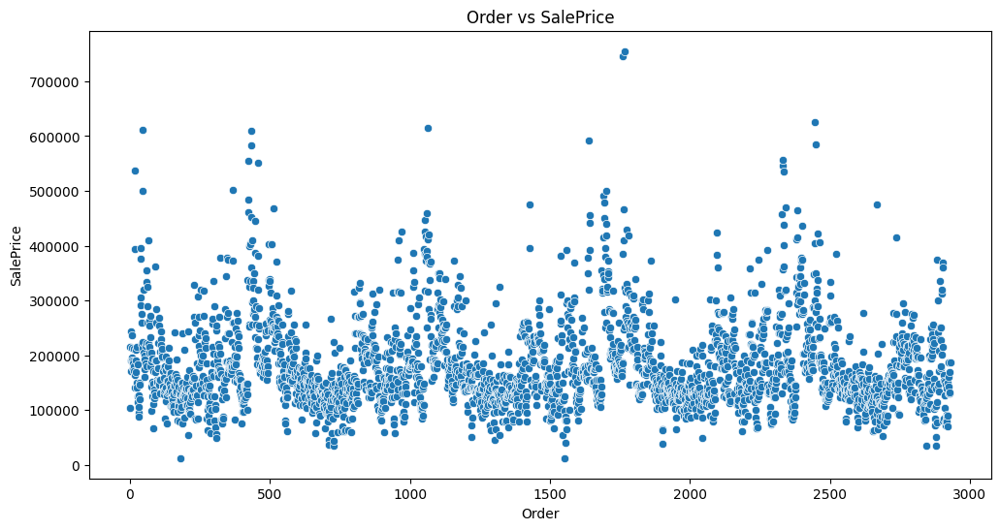

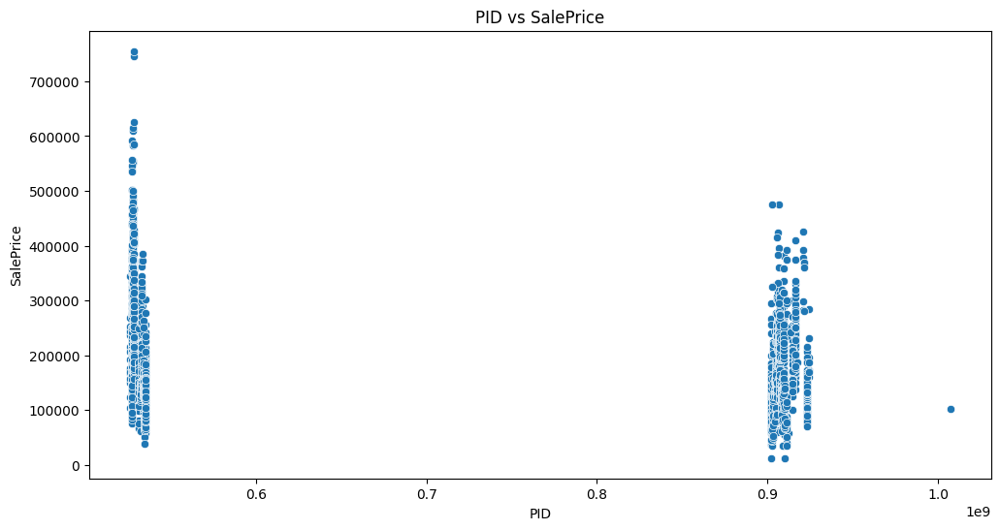

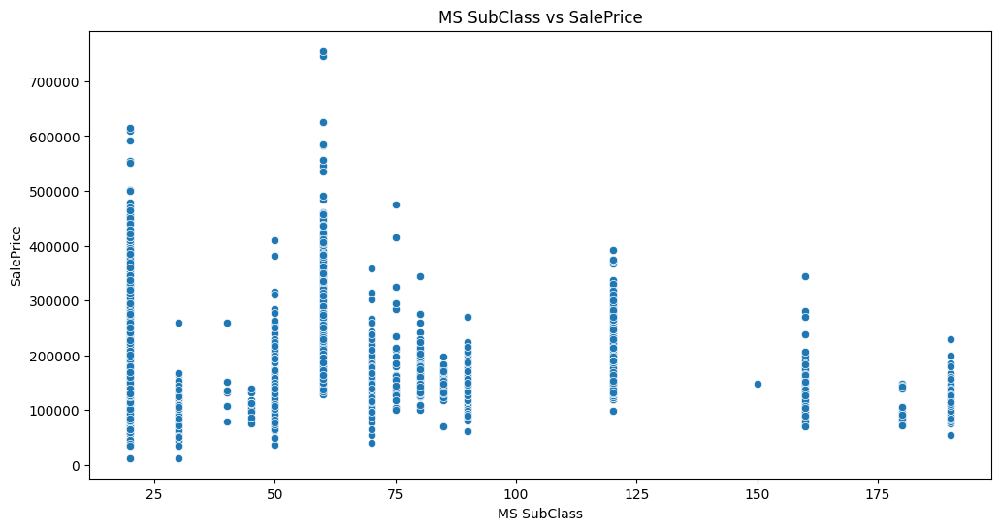

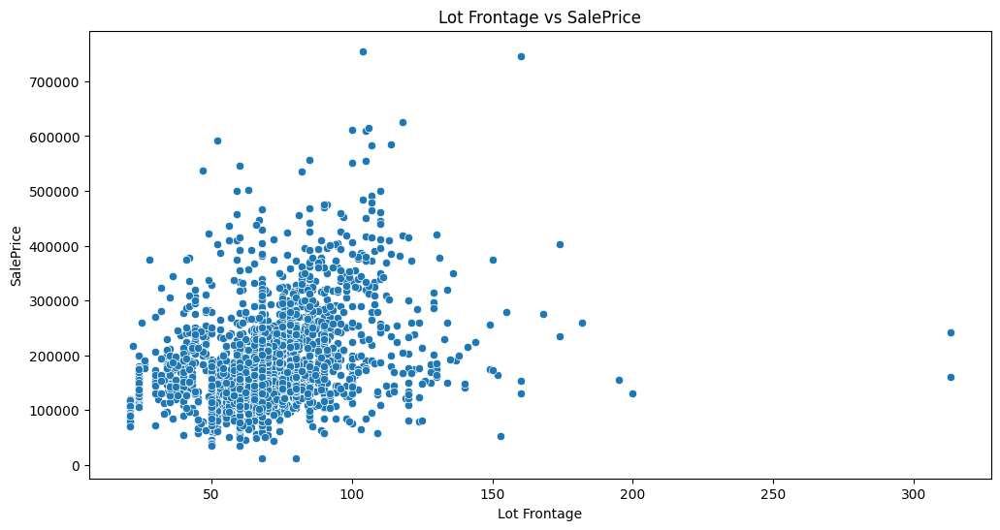

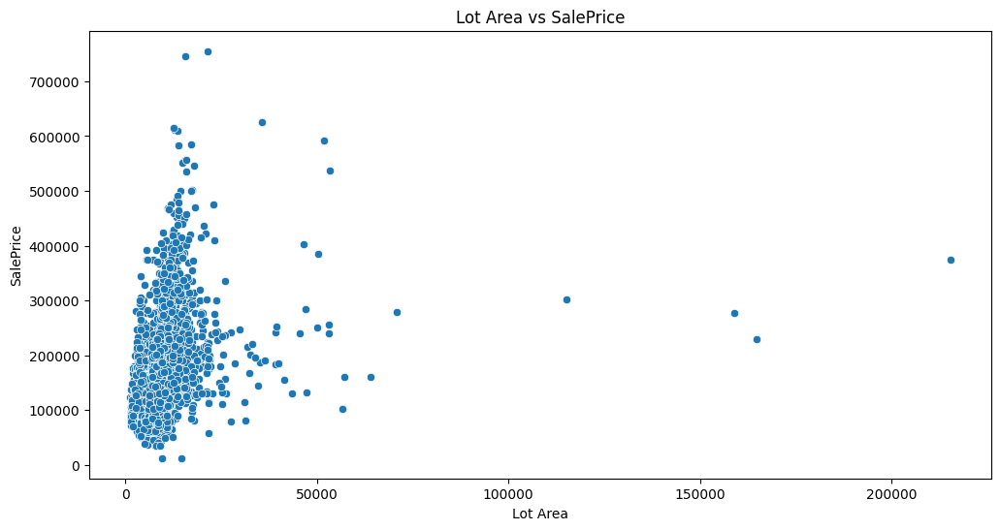

...

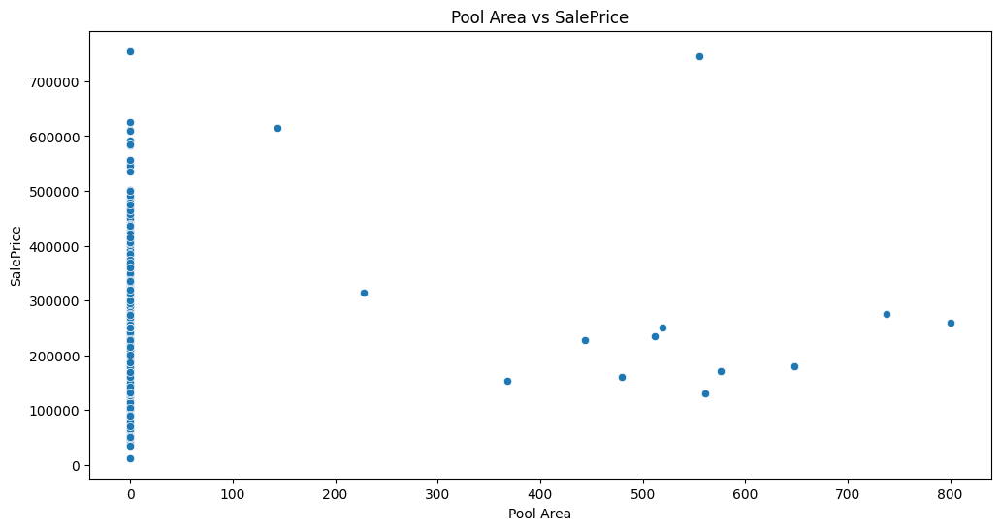

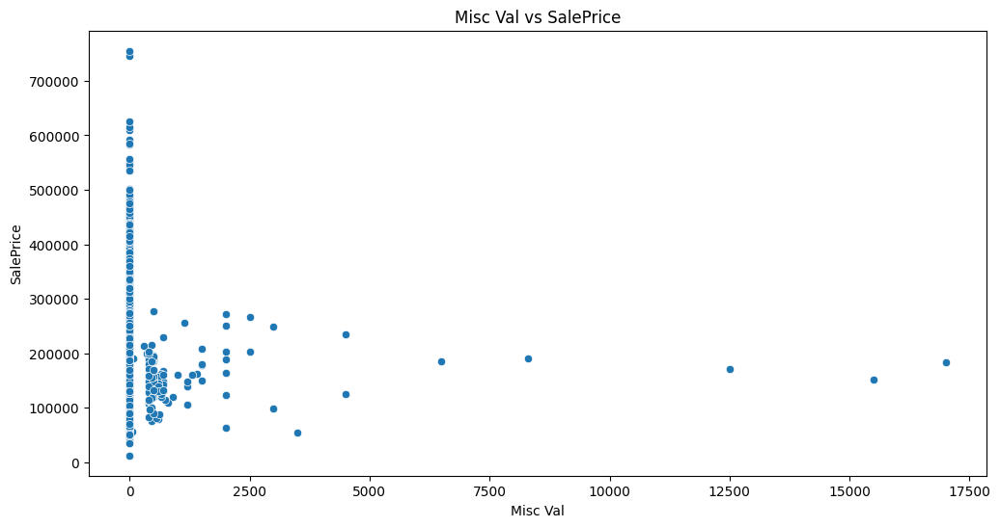

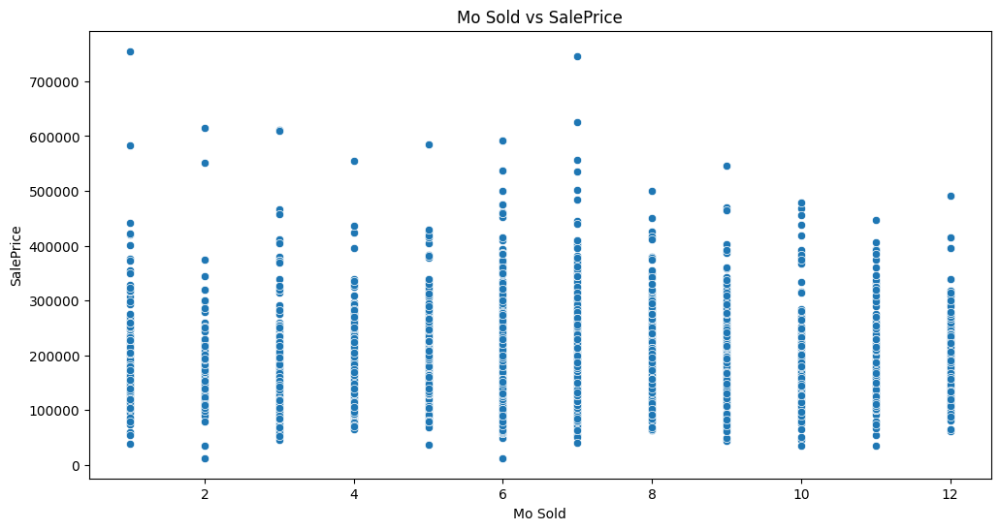

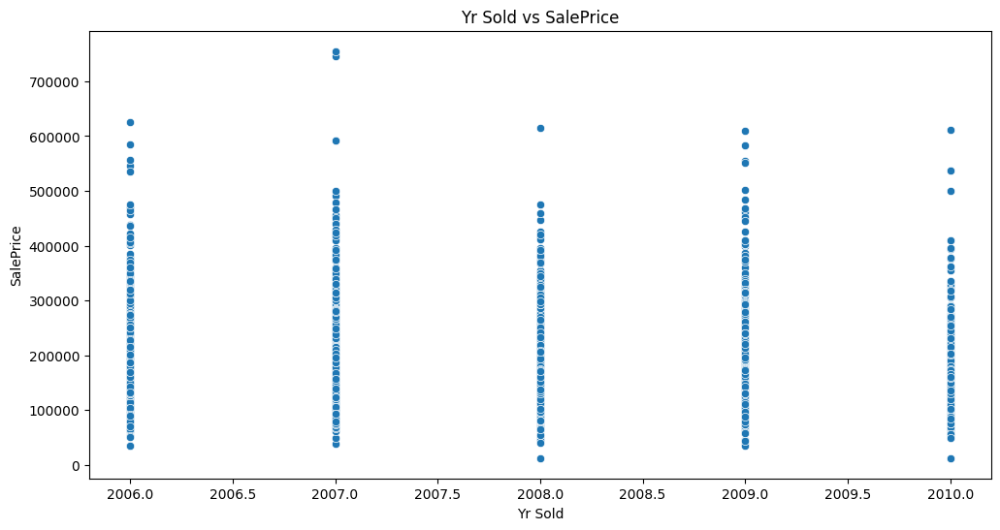

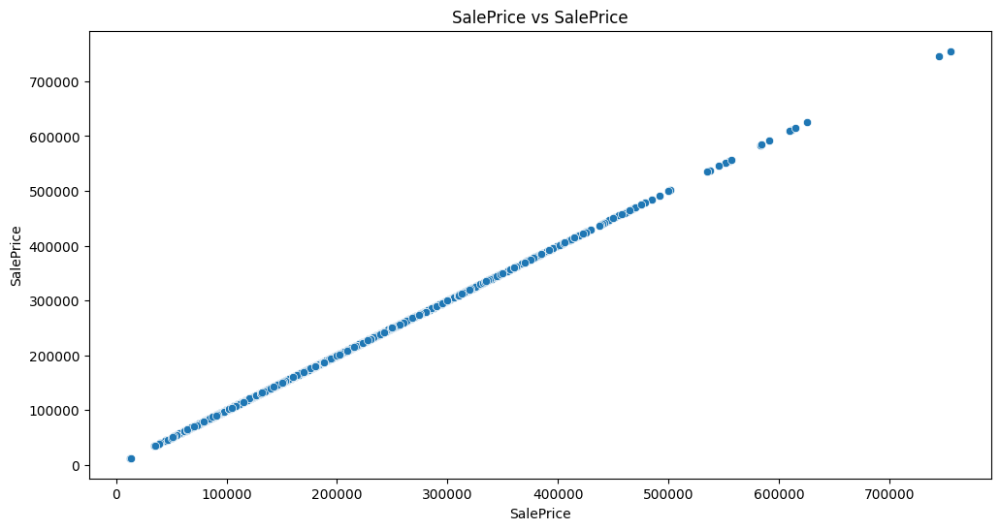

In [14]:
# Scatter plot to visualize outliers in relation to SalePrice
for feature in numerical_features:
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=feature, y='SalePrice', data=df)
    plt.title(f'{feature} vs SalePrice')
    plt.show()

# **Model Selection and Development**

In [15]:
X = df.drop('SalePrice', axis=1)
y = df['SalePrice']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [16]:
# Identify categorical and numerical features
categorical_features = X_train.select_dtypes(include=['object']).columns
numerical_features = X_train.select_dtypes(exclude=['object']).columns

# Create transformers for numerical and categorical features
numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown='ignore')  # Handle unknown categories during testing

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Fit and transform the training data
X_train_scaled = preprocessor.fit_transform(X_train)

# Transform the test data (using the same fit from training)
X_test_scaled = preprocessor.transform(X_test)

In [17]:
# Linear Regression
lr = LinearRegression()
lr.fit(X_train_scaled, y_train)
y_pred_lr = lr.predict(X_test_scaled)
print('Linear Regression RMSE:', mean_squared_error(y_test, y_pred_lr, squared=False))
print('Linear Regression R2:', r2_score(y_test, y_pred_lr))

# Random Forest Regressor
rf = RandomForestRegressor()
rf.fit(X_train_scaled, y_train)
y_pred_rf = rf.predict(X_test_scaled)
print('Random Forest RMSE:', mean_squared_error(y_test, y_pred_rf, squared=False))
print('Random Forest R2:', r2_score(y_test, y_pred_rf))


Linear Regression RMSE: 29634.718652241383
Linear Regression R2: 0.8904631993265714
Random Forest RMSE: 26512.001731718865
Random Forest R2: 0.9123315205746351


# **Model Evaluation**

In [18]:
# Evaluate Linear Regression Model
lr_rmse = mean_squared_error(y_test, y_pred_lr, squared=False)
lr_r2 = r2_score(y_test, y_pred_lr)

print('Linear Regression RMSE:', lr_rmse)
print('Linear Regression R2:', lr_r2)

# Evaluate Random Forest Model
rf_rmse = mean_squared_error(y_test, y_pred_rf, squared=False)
rf_r2 = r2_score(y_test, y_pred_rf)

print('Random Forest RMSE:', rf_rmse)
print('Random Forest R2:', rf_r2)


Linear Regression RMSE: 29634.718652241383
Linear Regression R2: 0.8904631993265714
Random Forest RMSE: 26512.001731718865
Random Forest R2: 0.9123315205746351


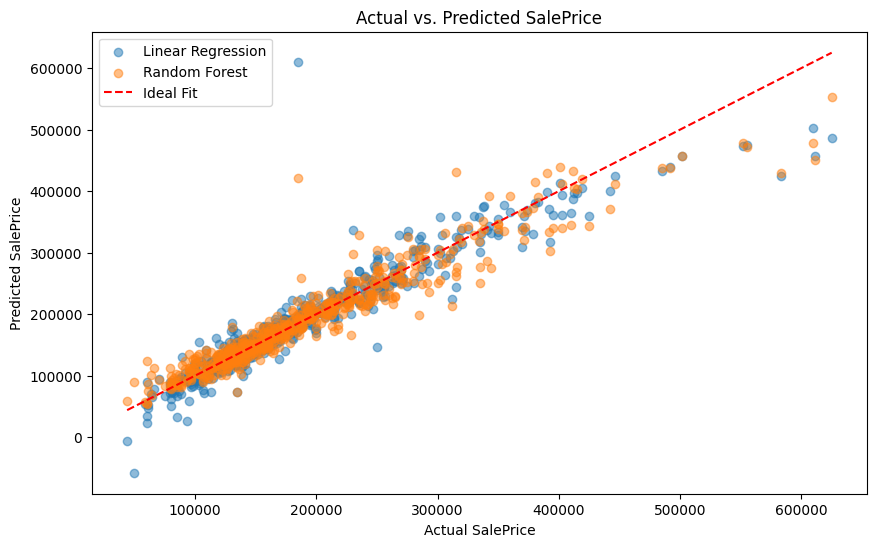

In [19]:
plt.figure(figsize=(10, 6))

# Scatter plot for Linear Regression
plt.scatter(y_test, y_pred_lr, alpha=0.5, label='Linear Regression')

# Scatter plot for Random Forest
plt.scatter(y_test, y_pred_rf, alpha=0.5, label='Random Forest')

# Ideal Fit line
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Ideal Fit')

plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.legend()
plt.title('Actual vs. Predicted SalePrice')
plt.show()


# **Model Insights**

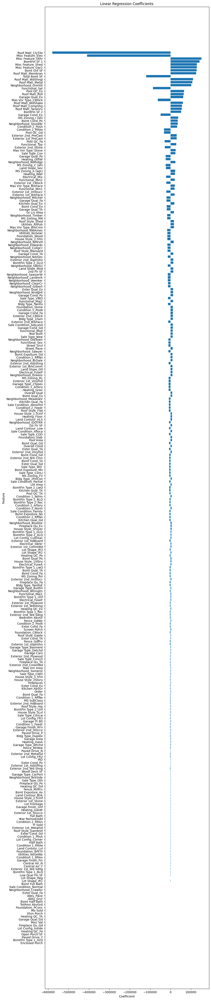

In [25]:
feature_names_num = numerical_features.tolist()
feature_names_cat = preprocessor.transformers_[1][1].get_feature_names_out(categorical_features).tolist()
features = feature_names_num + feature_names_cat

# Get coefficients from the Linear Regression model
coefficients = lr.coef_

# Create a DataFrame for coefficients
coef_df = pd.DataFrame({'Feature': features, 'Coefficient': coefficients})

# Sort the DataFrame by absolute value of coefficients
coef_df['AbsCoefficient'] = coef_df['Coefficient'].abs()
coef_df = coef_df.sort_values(by='AbsCoefficient', ascending=False).drop('AbsCoefficient', axis=1)

# Plot coefficients
plt.figure(figsize=(10,60))
plt.barh(coef_df['Feature'], coef_df['Coefficient'])
plt.xlabel('Coefficient')
plt.ylabel('Feature')
plt.title('Linear Regression Coefficients')
plt.gca().invert_yaxis()
plt.show()


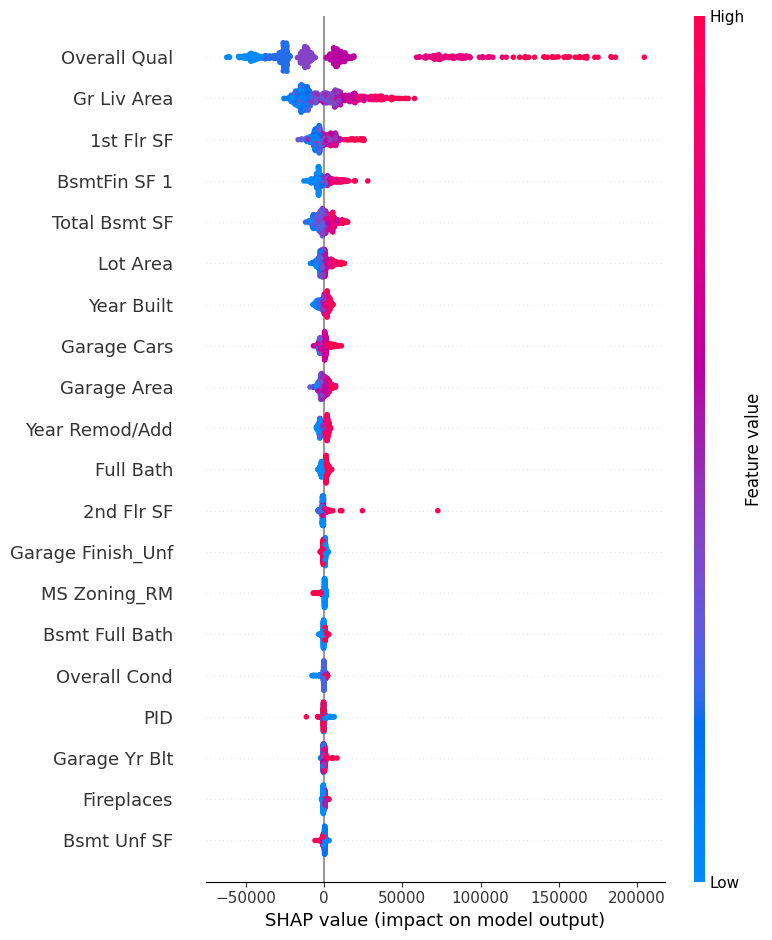

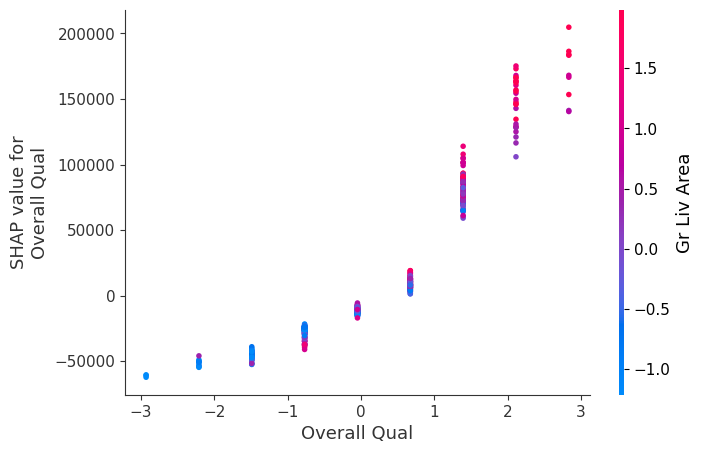

In [34]:
# Create a SHAP explainer object for the Random Forest model
explainer = shap.TreeExplainer(rf)

# Convert the sparse matrix to a dense NumPy array with a numeric dtype
X_test_dense = X_test_scaled.toarray().astype(np.float32)

# Calculate SHAP values for the test set using the dense array
shap_values = explainer.shap_values(X_test_dense)

# Get the correct feature names (combining numerical and categorical)
# Convert numerical_features to a list to match the type of get_feature_names_out
feature_names = list(numerical_features) + list(preprocessor.transformers_[1][1].get_feature_names_out(categorical_features))

# Plot summary of SHAP values, ensuring feature_names matches the data
shap.summary_plot(shap_values, X_test_dense, feature_names=feature_names)

# Plot dependence plot for a specific feature, using the correct feature names
shap.dependence_plot('Overall Qual', shap_values, X_test_dense, feature_names=feature_names)